In [1]:
!pip install opencv-python matplotlib numpy scikit-learn scikit-image > /dev/null

import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
import skimage

# 将附带的彩色图像（I0）转为灰度图像（记为I1）。

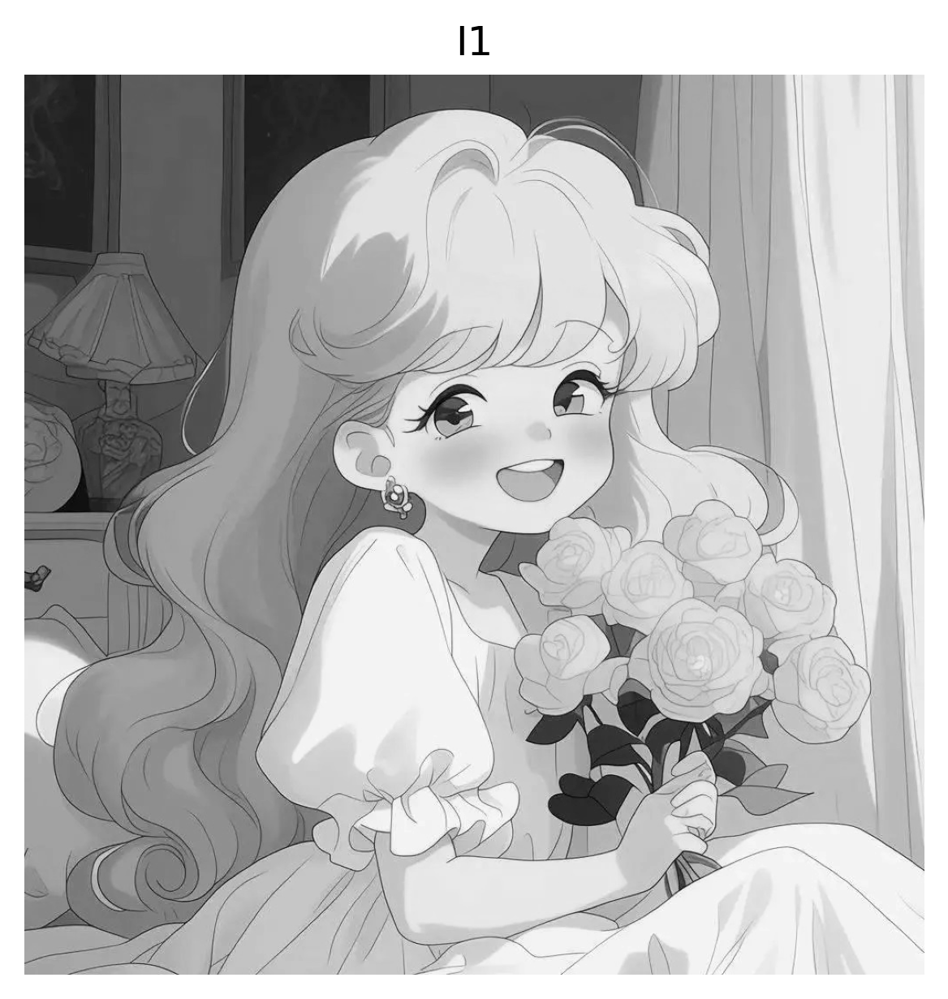

In [2]:
I0 = cv2.imread('./I0.jpg')
I1 = cv2.cvtColor(I0, cv2.COLOR_BGR2GRAY)

plt.figure(dpi=300)
plt.axis('off')
plt.title('I1')
plt.imshow(I1, cmap='gray')
plt.show()

# 在灰度图像I1上增加不同类型（类型>=3）的噪声，分别生成噪声图像。

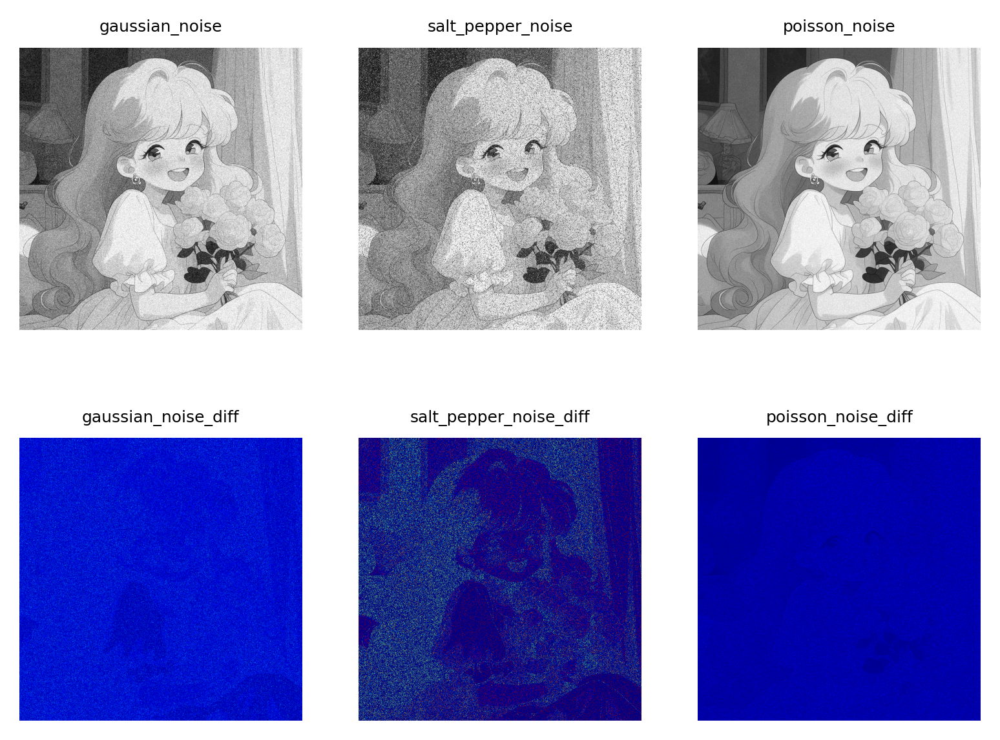

In [3]:
# 函数：添加高斯噪声
def add_gaussian_noise_on_gray(image, mean=0, var=1000):
    row, col = image.shape
    sigma = var ** 0.5  # 标准差
    # 生成一个与图像尺寸相同的高斯噪声矩阵，正态分布中取值
    gauss = np.random.normal(mean, sigma, (row, col))
    noisy_image = image + gauss
    # clip是将数组中的元素限制在a_min, a_max之间，大于a_max的就使得它等于a_max，小于a_min的就使得它等于a_min
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image


# 函数：添加椒盐噪声
def add_salt_and_pepper_noise_on_gray(image, salt_prob, pepper_prob):
    """
    向图像添加椒盐噪声

    参数:
    image: NumPy数组，代表灰度图像
    salt_prob: 添加“盐”噪声的概率
    pepper_prob: 添加“椒”噪声的概率
    """
    noisy_image = np.copy(image)
    num_rows, num_cols = image.shape

    # 添加“盐”噪声
    for i in range(num_rows):
        for j in range(num_cols):
            random_value = random.random()  # 生成一个0到1之间的随机数
            if random_value < salt_prob:
                noisy_image[i, j] = 255  # 将当前像素值设置为255（白色）

    # 添加“椒”噪声
    for i in range(num_rows):
        for j in range(num_cols):
            random_value = random.random()  # 再次生成一个0到1之间的随机数
            if random_value < pepper_prob:
                noisy_image[i, j] = 0  # 将当前像素值设置为0（黑色）

    return noisy_image


# 添加泊松噪声
def add_poisson_noise_on_gray(image):
    """
    向图像添加泊松噪声

    参数:
    image: NumPy数组，代表灰度图像
    """
    vals = 1.0  # 调整因子，具体数值可以根据需要调整

    # 生成一个与图像尺寸相同的泊松噪声矩阵
    noisy_image = np.random.poisson(image * vals) / float(vals)
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

noise_images = {}
noise_images_diff = {}
noise_images['gaussian_noise'] = add_gaussian_noise_on_gray(I1)
noise_images['salt_pepper_noise'] = add_salt_and_pepper_noise_on_gray(I1, 0.1, 0.1)
noise_images['poisson_noise'] = add_poisson_noise_on_gray(I1)

# 加了噪声的图像与原图像的对比
# 使用diff
diff_gaussian = cv2.absdiff(I1, noise_images['gaussian_noise'])
diff_salt_pepper = cv2.absdiff(I1, noise_images['salt_pepper_noise'])
diff_poisson = cv2.absdiff(I1, noise_images['poisson_noise'])

# 使用cv2.applyColorMap()函数将灰度图转换为伪彩色图
noise_images_diff['gaussian_noise_diff'] = cv2.cvtColor(cv2.applyColorMap(diff_gaussian, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
noise_images_diff['salt_pepper_noise_diff'] = cv2.cvtColor(cv2.applyColorMap(diff_salt_pepper, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)
noise_images_diff['poisson_noise_diff'] = cv2.cvtColor(cv2.applyColorMap(diff_poisson, cv2.COLORMAP_JET), cv2.COLOR_BGR2RGB)

plt.figure(dpi=300)
i = 1
for k, v in noise_images.items():
    plt.subplot(2, 3, i)
    plt.axis('off')
    plt.title(k, fontsize=6)
    plt.imshow(v, cmap='gray')
    i += 1

for k, v in noise_images_diff.items():
    plt.subplot(2, 3, i)
    plt.axis('off')
    plt.title(k, fontsize=6)
    plt.imshow(v, cmap='gray')
    i += 1

plt.show()

## 分析

**高斯噪声**：高斯噪声产生了一种随机的灰度级变化，使得图像看起来更"粗糙"。这种噪声不是集中在特定区域，而是均匀分布于整个图像上，导致整体图像的对比度下降，细节模糊。看起来像是图像上覆盖了一层细小的灰尘或雾霾。

**椒盐噪声**：椒盐噪声的效果是在图像上加上随机分布的白点255（白色，即“盐”）和黑点0（黑色，即“椒”），图像看起来像是受到了随机噪声的干扰。效果很明显，可以通过调整`salt_prob`和`pepper_prob`来控制噪声的密度。

**泊松噪声**：泊松噪声根据泊松分布添加噪声，这种噪声与图像本身的亮度有关。泊松噪声的强度依赖于图像像素值的大小。亮区域的噪声更为明显。

# 设计不同类型（类型>=3）的滤波器，对上述噪声图像分别进行去噪。对结果进行分析。

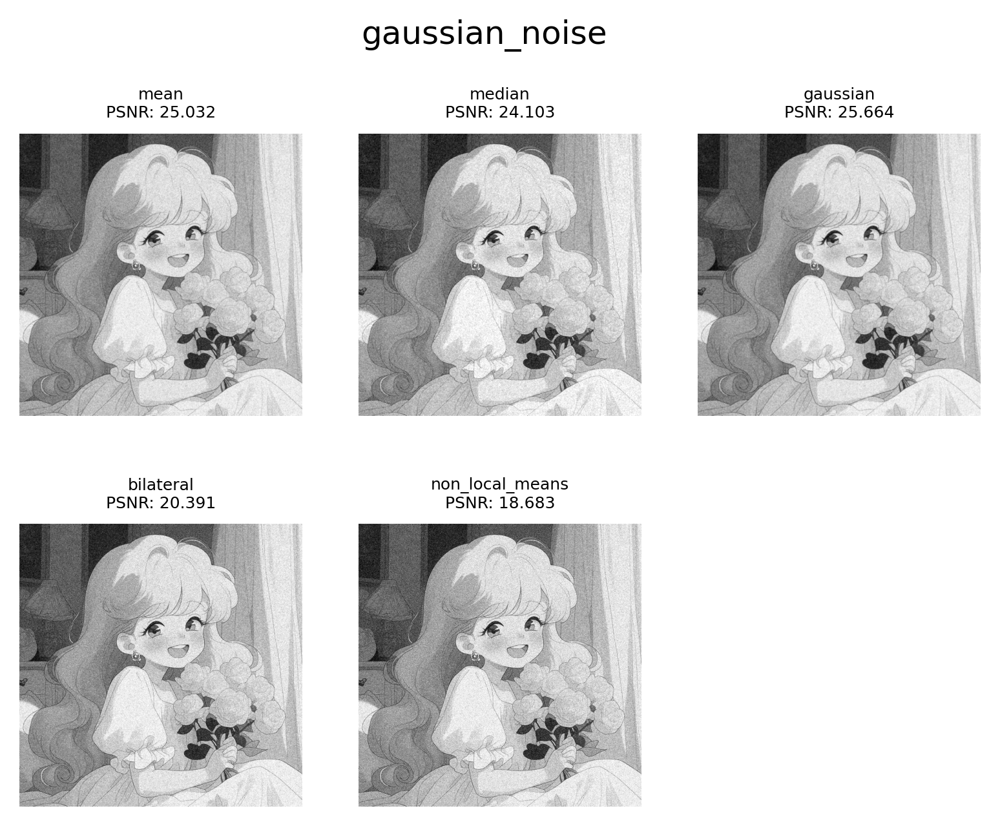

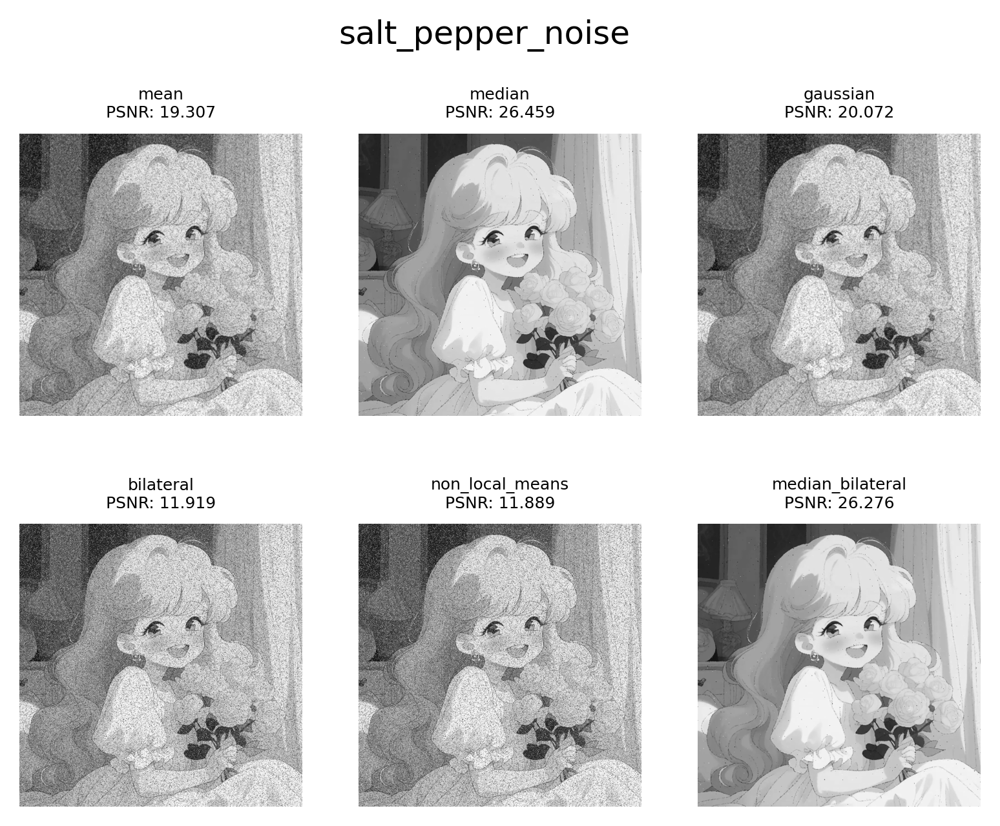

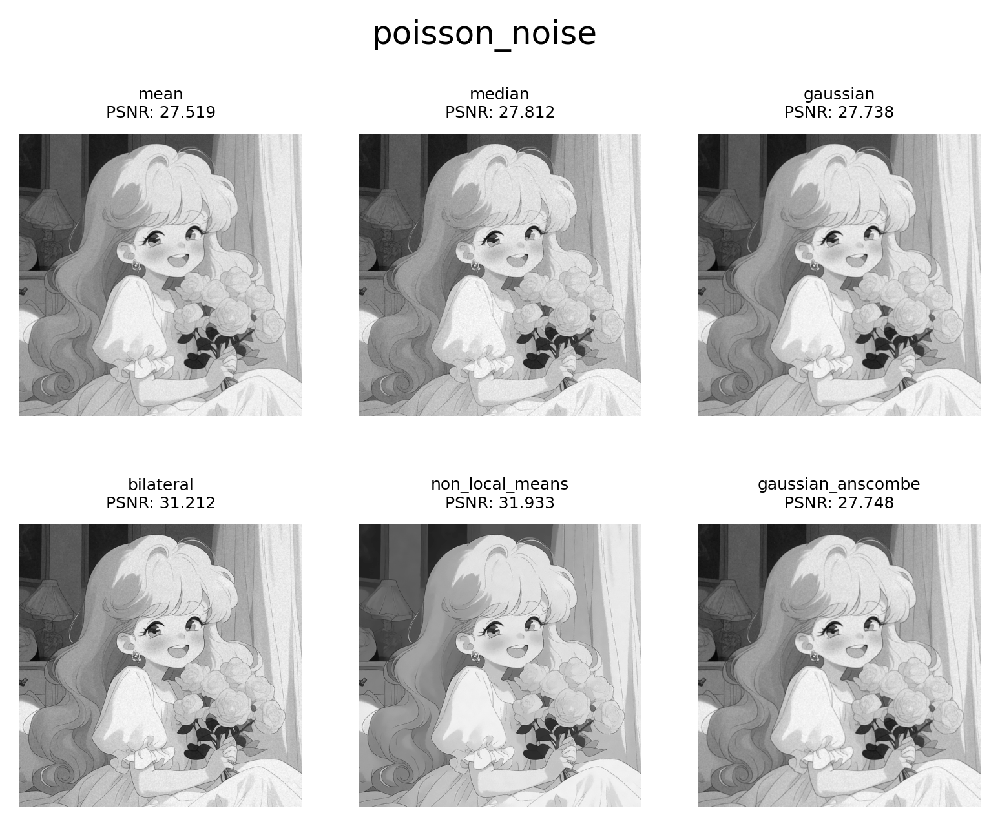

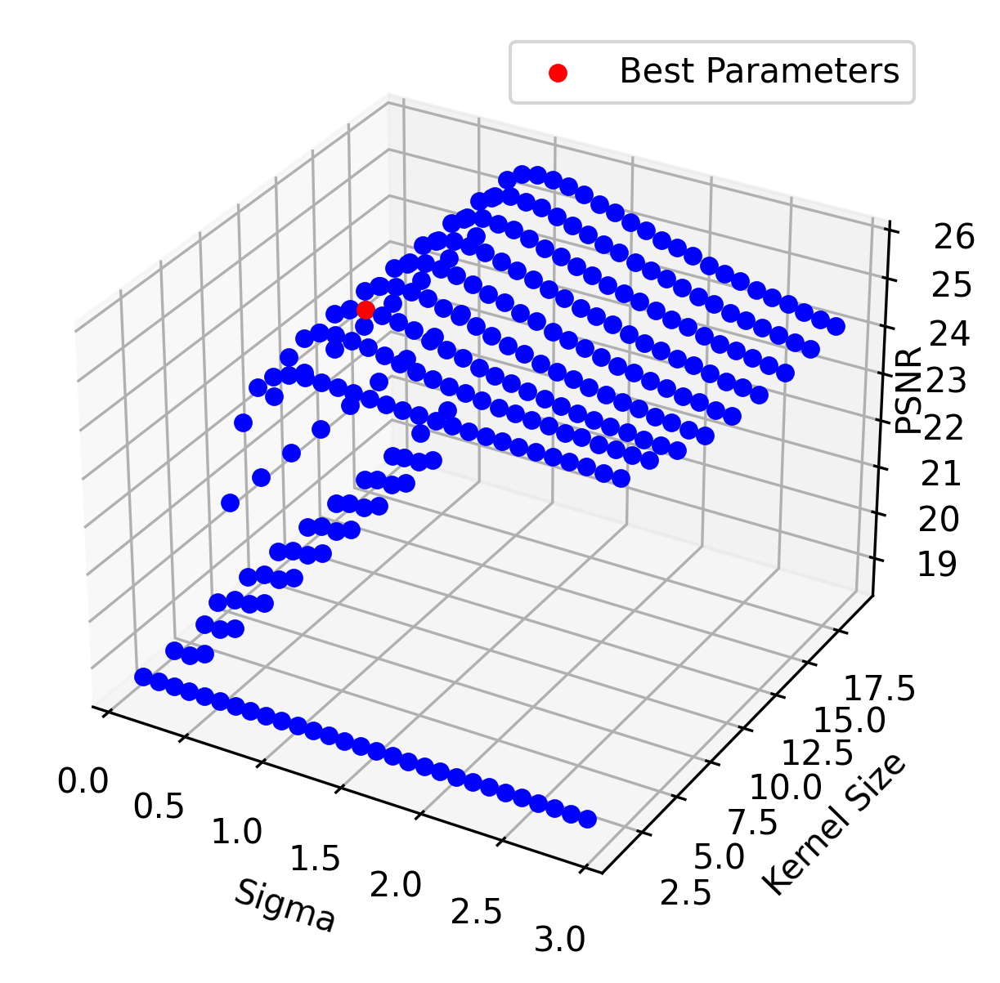

In [4]:
# 均值滤波
def mean_filter(image, kernel_size=3):
    return cv2.blur(image, (kernel_size, kernel_size))

# 中值滤波
def median_filter(image, kernel_size=3):
    return cv2.medianBlur(image, kernel_size)

# 高斯滤波
def gaussian_filter(image, kernel_size=7, sigma=1):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

# 双边滤波
def bilateral_filter(image, kernel_size=5, sigma=20):
    return cv2.bilateralFilter(image, kernel_size, sigma, sigma)

# 非局部均值滤波
def non_local_means_filter(image, h=10, templateWindowSize=7, searchWindowSize=21):
    return cv2.fastNlMeansDenoising(image, None, h, templateWindowSize, searchWindowSize)

# 波士顿变换
def anscombe_transform(x):
    return 2.0 * np.sqrt(x + 3.0 / 8.0)

# 逆波士顿变换
def inverse_anscombe_transform(x):
    return (x / 2.0) ** 2 - 3.0 / 8.0


def anscombe_gaussian_filter(image, sigma=1):
    # 应用波士顿变换
    img_transformed = anscombe_transform(image)
    # 应用高斯滤波器
    img_filtered = gaussian_filter(img_transformed, sigma=sigma)
    # 应用逆波士顿变换
    img_restored = inverse_anscombe_transform(img_filtered)
    return img_restored
    

# 应用滤波器
def process_gaussian_noise():
    # 1. 对高斯噪声图像应用三种滤波器
    image_gaussian_noise = noise_images['gaussian_noise']
    denoise_images = {}
    denoise_images['mean'] = mean_filter(image_gaussian_noise)
    denoise_images['median'] = median_filter(image_gaussian_noise)
    denoise_images['gaussian'] = gaussian_filter(image_gaussian_noise, 7, 1)
    denoise_images['bilateral'] = bilateral_filter(image_gaussian_noise)
    denoise_images['non_local_means'] = non_local_means_filter(image_gaussian_noise)

    plt.figure(dpi=300)
    plt.suptitle('gaussian_noise')
    i = 1
    for k, v in denoise_images.items():
        plt.subplot(2, 3, i)
        plt.axis('off')
        plt.title(f'{k}\nPSNR: {cv2.PSNR(I1, denoise_images[k]):.3f}', fontsize=6)
        plt.imshow(v, cmap='gray')
        i += 1
    plt.show()


def process_salt_pepper_noise():
    image_salt_pepper_noise = noise_images['salt_pepper_noise']
    denoise_images = {}
    denoise_images['mean'] = mean_filter(image_salt_pepper_noise)
    denoise_images['median'] = median_filter(image_salt_pepper_noise)
    denoise_images['gaussian'] = gaussian_filter(image_salt_pepper_noise)
    denoise_images['bilateral'] = bilateral_filter(image_salt_pepper_noise)
    denoise_images['non_local_means'] = non_local_means_filter(image_salt_pepper_noise)
    # 6.尝试先中值再双边
    denoise_images['median_bilateral'] = bilateral_filter(median_filter(image_salt_pepper_noise))

    plt.figure(dpi=300)
    plt.suptitle('salt_pepper_noise')
    i = 1
    for k, v in denoise_images.items():
        plt.subplot(2, 3, i)
        plt.axis('off')
        plt.title(f'{k}\nPSNR: {cv2.PSNR(I1, denoise_images[k]):.3f}', fontsize=6)
        plt.imshow(v, cmap='gray')
        i += 1
    plt.show()


def process_poission_noise():
    image_poisson_noise = noise_images['poisson_noise']
    denoise_images = {}
    denoise_images['mean'] = mean_filter(image_poisson_noise)
    denoise_images['median'] = median_filter(image_poisson_noise)
    denoise_images['gaussian'] = gaussian_filter(image_poisson_noise)
    denoise_images['bilateral'] = bilateral_filter(image_poisson_noise)
    denoise_images['non_local_means'] = non_local_means_filter(image_poisson_noise)
    # 波士顿变换
    denoise_images['gaussian_anscombe'] = anscombe_gaussian_filter(image_poisson_noise).astype(np.uint8)

    plt.figure(dpi=300)
    plt.suptitle('poisson_noise')
    i = 1
    for k, v in denoise_images.items():
        plt.subplot(2, 3, i)
        plt.axis('off')
        plt.title(f'{k}\nPSNR: {cv2.PSNR(I1, denoise_images[k]):.3f}', fontsize=6)
        plt.imshow(v, cmap='gray')
        i += 1
    plt.show()


# 网格搜索下，看看参数变化对高斯滤波效果的影响
def explore_gaussian_filter_parameter():
    image_gaussian_noise = noise_images['gaussian_noise']
    best_psnr = 0
    best_sigma = 0
    best_kernel_size = 0
    psnr_values = []

    fig = plt.figure(dpi=300)
    ax = fig.add_subplot(111, projection='3d')
    for sigma in np.arange(0.1, 3.0, 0.1):
        for kernel_size in range(1, 20, 2):
            image_gaussian_gaussian = gaussian_filter(image_gaussian_noise, kernel_size, sigma)
            psnr_gaussian = cv2.PSNR(I1, image_gaussian_gaussian)
            psnr_values.append(psnr_gaussian)
            if psnr_gaussian > best_psnr:
                best_psnr = psnr_gaussian
                best_sigma = sigma
                best_kernel_size = kernel_size
            ax.scatter(sigma, kernel_size, psnr_gaussian, color='b')

    ax.set_xlabel('Sigma')
    ax.set_ylabel('Kernel Size')
    ax.text2D(0.975, 0.6, "PSNR", rotation=90, transform=ax.transAxes, va='center', ha='center')
    ax.scatter(best_sigma, best_kernel_size, best_psnr, color='r', label='Best Parameters')
    ax.legend()
    plt.subplots_adjust(right=0.8)
    plt.show()


process_gaussian_noise()
process_salt_pepper_noise()
process_poission_noise()
explore_gaussian_filter_parameter()

## 分析

**高斯噪声**：对于高斯噪声，**高斯滤波器、均值滤波器和中值滤波器的效果最好（差不太多）**。这是因为这两种滤波器都是线性滤波器，能够很好地处理高斯噪声。双边滤波器和非局部均值滤波器的效果较差，可能是因为它们在保护图像细节的同时，也保留了一部分噪声。

**波松噪声**：对于泊松噪声，**非局部均值滤波器的效果最好**，紧随其后的是**高斯滤波器**和**波士顿变换后的高斯滤波器**。非局部均值滤波器是一种基于图像的自相似性的滤波器，它能够在保护图像细节的同时，有效地去除噪声。波士顿变换能够将泊松噪声转换为高斯噪声，然后就可以使用对高斯噪声处理效果较好的滤波器来进行去噪。



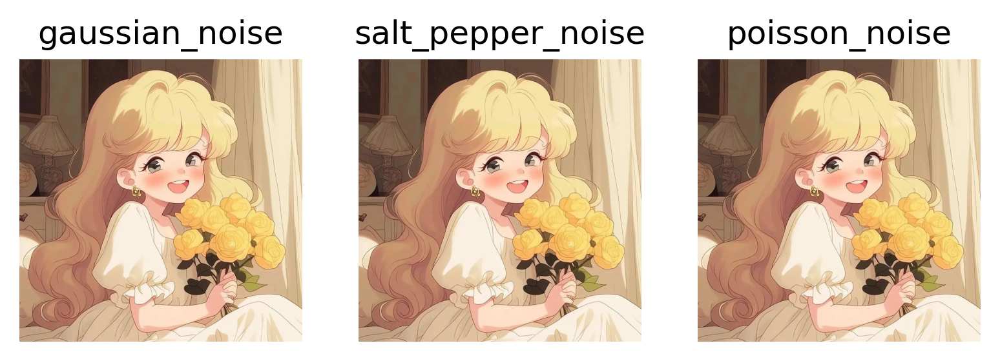

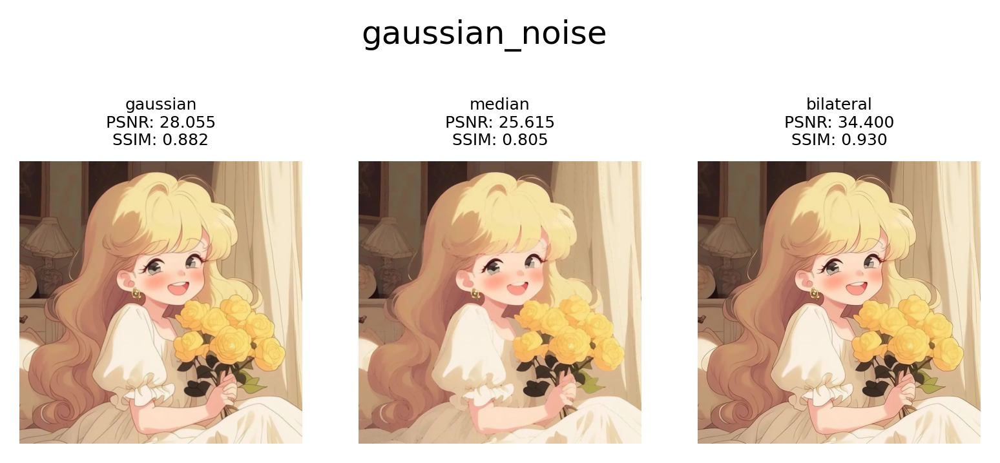

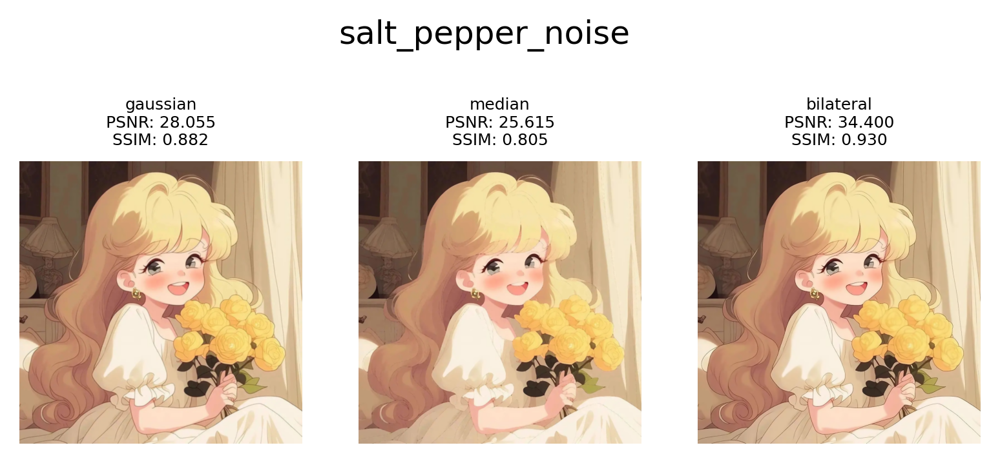

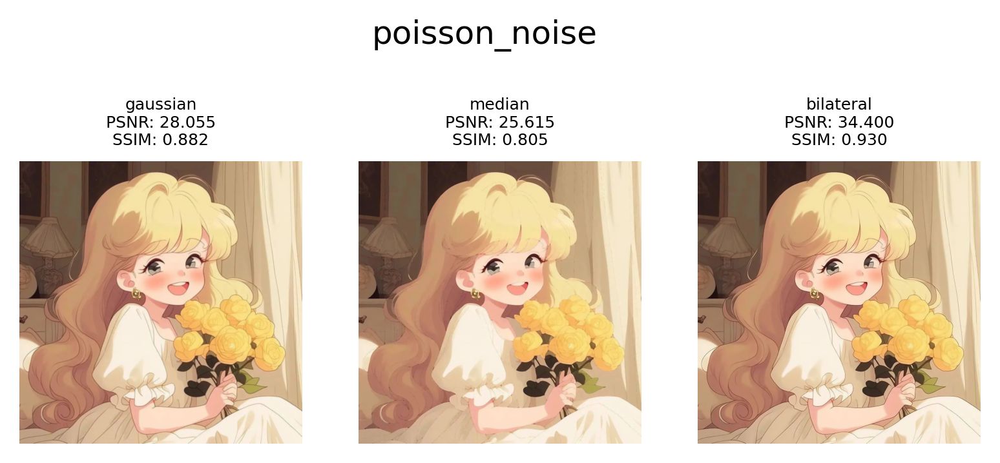

In [5]:
def add_noise(image, noise_type):
    if noise_type == "gaussian":
        noisy_image = skimage.util.random_noise(image, mode='gaussian', var=0.01)
    elif noise_type == "salt_pepper":
        noisy_image = skimage.util.random_noise(image, mode='s&p', amount=0.05)
    elif noise_type == "poisson":
        noisy_image = skimage.util.random_noise(image, mode='poisson')
    else:
        return image
    # 转换回[0, 255]区间的uint8类型
    noisy_image = (255 * noisy_image).astype(np.uint8)
    return noisy_image

def remove_noise(image, method):
    if method == "median":
        denoised_image = cv2.medianBlur(image, 5)
    elif method == "gaussian":
        denoised_image = cv2.GaussianBlur(image, (5, 5), 0)
    elif method == "bilateral":
        denoised_image = cv2.bilateralFilter(image, 9, 75, 75)
    else:
        return image
    return denoised_image
    

image = cv2.cvtColor(I0, cv2.COLOR_BGR2RGB)    
noise_color_images = {}
for noise in ['gaussian_noise', 'salt_pepper_noise', 'poisson_noise']:
    noise_color_images[noise] = add_noise(image, noise)

plt.figure(dpi=300)
i = 1
for k, v in noise_color_images.items():
    plt.subplot(1, 3, i)
    plt.axis('off')
    plt.title(k)
    plt.imshow(v)
    i += 1
plt.show()

denoise_color_images = {}
for noise in noise_color_images:
    denoise_color_images[noise] = {}
    plt.figure(dpi=300)
    plt.suptitle(noise, y=0.8)
    i = 1
    for method in ['gaussian', 'median', 'bilateral']:
        denoise_color_images[noise][method] = remove_noise(noise_color_images[noise], method)
        psnr = skimage.metrics.peak_signal_noise_ratio(image, denoise_color_images[noise][method])
        ssim = skimage.metrics.structural_similarity(image, denoise_color_images[noise][method], multichannel=True, channel_axis=-1)
        plt.subplot(1, 3, i)
        plt.axis('off')
        plt.title(f'{method}\nPSNR: {psnr:.3f}\nSSIM: {ssim:.3f}', fontsize=6)
        plt.imshow(denoise_color_images[noise][method])
        i += 1
    plt.show()


## 分析

双边滤波在消除泊松噪声上还是比较明显的

1. **高斯噪声**的处理中，双边滤波表现最佳，高斯滤波次之，中值滤波效果最差。这表明双边滤波在保留图像边缘信息的同时，更有效地去除了高斯噪声。
2. **椒盐噪声**的处理中，中值滤波效果最好，这是因为中值滤波特别适合去除这类噪声，它可以有效地去除图像中的极端值。双边滤波表现最差，可能是因为双边滤波对椒盐噪声不够敏感。
3. **泊松噪声**的处理中，双边滤波再次表现最佳，显著优于其他两种方法。这说明双边滤波在处理泊松噪声时能较好地保留图像细节和结构。

# 总结

- **双边滤波**通常提供最高的SSIM值，尤其是对泊松噪声，表明其在保持图像结构和细节方面的优越性。
- **中值滤波**对椒盐噪声特别有效，因其能够清除图像中的孤立噪点。
- **高斯滤波**在去除高斯噪声方面表现良好，但对保持图像细节的能力不如双边滤波。